In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra
from sentence_transformers import SentenceTransformer
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# LLM Embedding

In [2]:
df = pd.read_csv("../../cleaned_data_v2.csv")


In [3]:
# bedrooms to 3 categories as >4 , <3 and others
df['bedrooms_cat'] = df['bedrooms'].apply(lambda x: '>4' if x>4 else '<3' if x<3 else '3-4')
df['lot_size_category'] = pd.qcut(df['sqft_lot'], q=3, labels=False)
df['grade_living_category'] = pd.qcut(df['grade_living'], q=3, labels=False)

In [4]:
def compile_text(x):
    text =  f"""Bedrooms: {x['bedrooms_cat']}, 
                Lot Size (sqft): {x['lot_size_category']}, 
                Floors: {x['floors']}, 
                View: {x['view']}, 
                Condition: {x['condition']}, 
                Bathroom Category: {x['bathroom_category']}, 
                Near Shore: {x['is_near_shore']}, 
                Grade Living: {x['grade_living_category']}
            """
    return text

In [5]:
sentences = df.apply(lambda x: compile_text(x), axis=1).tolist()

In [6]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [7]:
output = model.encode(sentences=sentences, show_progress_bar= True, normalize_embeddings  = True)

Batches: 100%|██████████| 676/676 [00:23<00:00, 29.01it/s]


In [8]:
df_embedding = pd.DataFrame(output)

In [9]:
df_embedding.to_csv("embedding_train.csv",index = False)


# Clustering

In [10]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [11]:
df_embedding = pd.read_csv("embedding_train.csv")

In [12]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)


df_embedding_with_out = df_embedding.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [13]:
df_embedding_no_out.shape

(19451, 384)

In [14]:
df_embedding_with_out.shape

(21613, 384)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


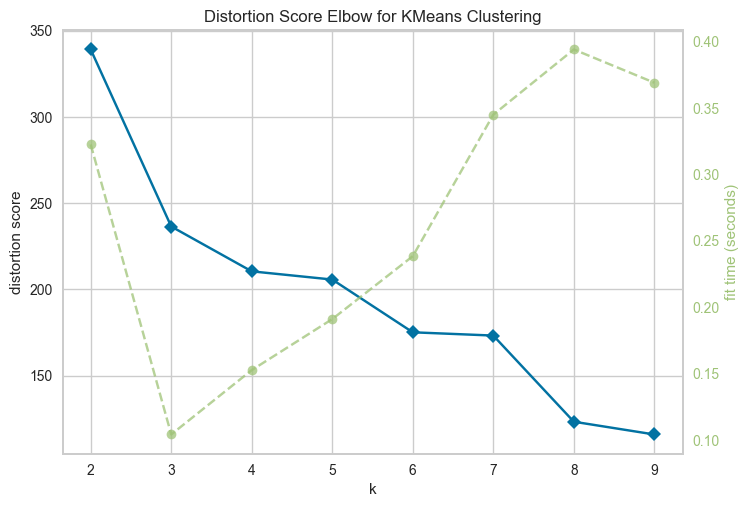

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [15]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=False)
 
visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

In [16]:
def make_Silhouette_plot(X, n_clusters):
    plt.xlim([-0.1, 1])
    plt.ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg,
    )
# Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
        plt.xlabel("The silhouette coefficient values", fontsize=24)
        plt.ylabel("Cluster label", fontsize=24)
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
range_n_clusters = list(range(2,10))
for n_clusters in range_n_clusters:
    print(f"N cluster: {n_clusters}")
    make_Silhouette_plot(df_embedding_no_out, n_clusters)   
    plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
    plt.close()

N cluster: 2
For n_clusters = 2 The average silhouette_score is : 0.512723038456564
N cluster: 3
For n_clusters = 3 The average silhouette_score is : 0.5282896355866123
N cluster: 4
For n_clusters = 4 The average silhouette_score is : 0.4467649975789438
N cluster: 5
For n_clusters = 5 The average silhouette_score is : 0.4546404740916589
N cluster: 6
For n_clusters = 6 The average silhouette_score is : 0.33830308260710146
N cluster: 7
For n_clusters = 7 The average silhouette_score is : 0.3497381927524094
N cluster: 8
For n_clusters = 8 The average silhouette_score is : 0.36857249632900924
N cluster: 9
For n_clusters = 9 The average silhouette_score is : 0.377061118531989


In [24]:
n_clusters = 3

clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out)

179.1688583754365


In [25]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters_predict)}")

Davies bouldin score: 0.736367167931966
Calinski Score: 11084.550209040468
Silhouette Score: 0.5282896355866123


In [72]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            125.696        32.73%                     32.73%
1             63.784        16.61%                     49.34%
2             49.814        12.97%                     62.32%


In [73]:
import numpy as np
import plotly.express as px
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from umap.umap_ import UMAP  # Import UMAP from umap.umap_

# Generate sample data
X = df_embedding_no_out.copy()

# Apply UMAP for dimensionality reduction
reducer = UMAP(n_components=3)  # Specify 3 components for 3D visualization
embedding = reducer.fit_transform(X)

# # Visualize clusters in 3D with Plotly
# fig = px.scatter_3d(x=embedding[:, 0], y=embedding[:, 1], z=embedding[:, 2], color=clusters_predict,
#                     opacity=0.7, labels={'color': 'Cluster'}, title='UMAP 3D Visualization of Clusters')
# fig.show()

fig = px.scatter_3d(df, 
                        x=embedding[:, 0], 
                        y=embedding[:, 1], 
                        z=embedding[:, 2],
                        color=clusters_predict,
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title="UMAP Space").update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": 1,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": 0.1,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
fig.show()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [27]:
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [28]:
df_no_outliers["cluster"] = clusters_predict

In [74]:

# Define custom hover data
hover_data = {
    'price': True,
    'grade_living': True,
    'bedrooms': True,
    'bathrooms': True,
    'sqft_lot': True,
    'floors': True,
    'waterfront': True,
    'view': True,
    'condition': True,
    'yr_built': True,
    'yr_renovated': True,
    'is_near_shore': True,
    'nearest_station_distance_km': True

}

# Create scatter plot with custom hover data
fig = px.scatter_mapbox(df_no_outliers, 
                        lat="lat", 
                        lon="long", 
                        color="cluster",
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        zoom=10,
                        mapbox_style="carto-positron",
                        title="Clusters on Lat Long",
                        height=800,
                        width=1000,
                        hover_data=hover_data)

fig.update_layout(hovermode='closest')
# Show the figure
fig.show()

In [67]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'price': 'mean',
        'bedrooms': lambda x: x.value_counts().index[0],
        'bathrooms': lambda x: x.value_counts().index[0],
        'sqft_lot': 'mean',
        'floors': lambda x: x.value_counts().index[0],
        'waterfront': lambda x: x.value_counts().index[0],
        'view': lambda x: x.value_counts().index[0],
        'condition': lambda x: x.value_counts().index[0],
        'yr_built': 'mean',
        'yr_renovated': 'mean',
        'zipcode': lambda x: x.value_counts().index[0],
        'lat': 'mean',
        'long': 'mean',
        'nearest_station_distance_km': 'mean',
        'density': 'mean',
        'commute_time': 'mean',
        'distance_to_point_km': 'mean',
        'is_near_shore': lambda x: x.value_counts().index[0],
        'grade_living': lambda x: x.value_counts().index[0]
    }
).sort_values("price").reset_index()

df_group


,cluster,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,0,326560.836549,3,1.0,12721.763378,1.0,0,0,3,1948.191118,65.191482,98133,47.553015,-122.256051,13098.464446,5353.277394,30.076338,3.160945,False,8400
1,1,533307.682812,3,2.5,16480.127750,2.0,0,0,3,1978.536537,69.023607,98038,47.555445,-122.190310,16237.662637,4523.306188,30.310762,3.578082,False,11760
2,2,781896.772884,3,2.5,8920.398964,1.0,0,0,3,1964.957686,191.499136,98103,47.589077,-122.279632,8726.201260,7137.665803,28.431347,0.307385,True,14000


In [48]:
# print std of price for each cluster
print(df_no_outliers.groupby('cluster')['price'].std().astype(int))
print('without clusters: ',df_no_outliers['price'].std().astype(int))


cluster
0    144484
1    296685
2    434362
Name: price, dtype: int64
without clusters:  306642


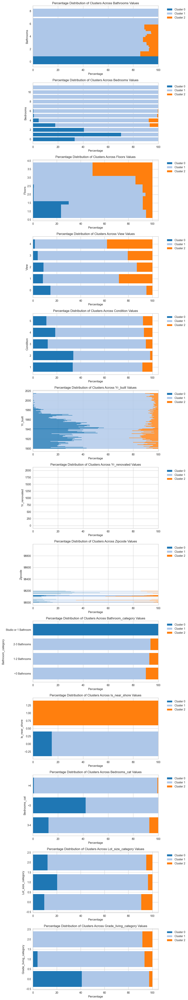

In [56]:
columns_to_plot = ['bathrooms', 'bedrooms','floors', 'view', 'condition', 'yr_built', 'yr_renovated', 'zipcode','bathroom_category','is_near_shore','bedrooms_cat','lot_size_category','grade_living_category']
# Create a figure with multiple subplots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(10,4 * len(columns_to_plot)))

# If only one column, axes is not a list, so we make it a list for uniformity
if len(columns_to_plot) == 1:
    axes = [axes]

# Iterate over each column and plot
for ax, column in zip(axes, columns_to_plot):
    # Calculate the percentage distribution of column values within each cluster
    distribution_df = df_no_outliers.groupby(column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

    # Plot each cluster as a stack
    bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
    colors = sns.color_palette("tab20", len(distribution_df.columns))

    for i, cluster in enumerate(distribution_df.columns):
        ax.barh(distribution_df.index, distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
        bottom += distribution_df[cluster]

    # Customize the plot
    ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Values')
    ax.set_xlabel('Percentage')
    ax.set_ylabel(column.capitalize())
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [51]:
# show all column names pd options
pd.set_option('display.max_columns', None)


In [52]:
df_no_outliers.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,cluster
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,3-4,0,0,0
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,3-4,1,2,1
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,<3,2,0,0
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,3-4,0,1,2
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,3-4,1,1,1


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_30875/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_30875/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_30875/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

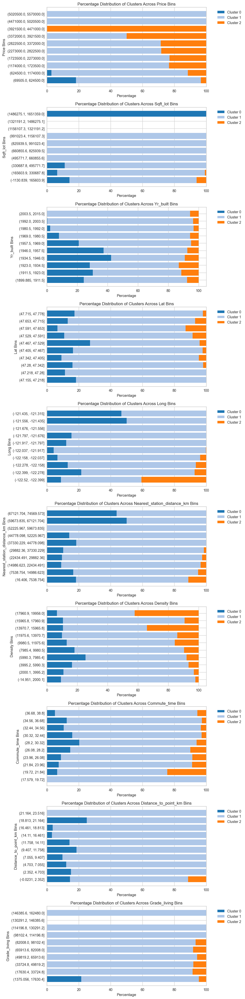

In [55]:
continuous_columns_to_plot = ['price', 'sqft_lot', 'yr_built','lat', 'long', 'nearest_station_distance_km', 'density', 'commute_time', 'distance_to_point_km','grade_living']

# Define the number of bins for continuous variables
num_bins = 10

# Bin the continuous variables and add them to the DataFrame
for column in continuous_columns_to_plot:
    df_no_outliers[f'{column}_bin'] = pd.cut(df_no_outliers[column], bins=num_bins)

# Create a figure with multiple subplots
fig, axes = plt.subplots(len(continuous_columns_to_plot), 1, figsize=(10, 4 * len(continuous_columns_to_plot)))

# If only one column, axes is not a list, so we make it a list for uniformity
if len(continuous_columns_to_plot) == 1:
    axes = [axes]

# Iterate over each column and plot
for ax, column in zip(axes, continuous_columns_to_plot):
    binned_column = f'{column}_bin'
    
    # Calculate the percentage distribution of binned column values within each cluster
    distribution_df = df_no_outliers.groupby(binned_column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

    # Plot each cluster as a stack
    bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
    colors = sns.color_palette("tab20", len(distribution_df.columns))

    for i, cluster in enumerate(distribution_df.columns):
        ax.barh(distribution_df.index.astype(str), distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
        bottom += distribution_df[cluster]

    # Customize the plot
    ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Bins')
    ax.set_xlabel('Percentage')
    ax.set_ylabel(column.capitalize() + ' Bins')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [88]:
df_no_outliers.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,cluster,price_bin,sqft_lot_bin,yr_built_bin,lat_bin,long_bin,nearest_station_distance_km_bin,density_bin,commute_time_bin,distance_to_point_km_bin,grade_living_bin
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,3-4,0,0,0,"(69505.0, 624500.0]","(-1130.839, 165603.9]","(1946.0, 1957.5]","(47.467, 47.529]","(-122.278, -122.158]","(7538.754, 14986.623]","(3995.2, 5990.3]","(32.44, 34.56]","(-0.0231, 2.352]","(1375.056, 17630.4]"
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,3-4,1,2,1,"(69505.0, 624500.0]","(-1130.839, 165603.9]","(1946.0, 1957.5]","(47.715, 47.778]","(-122.399, -122.278]","(16.406, 7538.754]","(7985.4, 9980.5]","(28.2, 30.32]","(2.352, 4.703]","(17630.4, 33724.8]"
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,<3,2,0,0,"(69505.0, 624500.0]","(-1130.839, 165603.9]","(1923.0, 1934.5]","(47.715, 47.778]","(-122.278, -122.158]","(7538.754, 14986.623]","(2000.1, 3995.2]","(32.44, 34.56]","(-0.0231, 2.352]","(1375.056, 17630.4]"
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,3-4,0,1,2,"(69505.0, 624500.0]","(-1130.839, 165603.9]","(1957.5, 1969.0]","(47.467, 47.529]","(-122.399, -122.278]","(7538.754, 14986.623]","(5990.3, 7985.4]","(30.32, 32.44]","(-0.0231, 2.352]","(1375.056, 17630.4]"
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,3-4,1,1,1,"(69505.0, 624500.0]","(-1130.839, 165603.9]","(1980.5, 1992.0]","(47.591, 47.653]","(-122.158, -122.037]","(14986.623, 22434.491]","(2000.1, 3995.2]","(32.44, 34.56]","(-0.0231, 2.352]","(1375.056, 17630.4]"


In [89]:
# List of column names used in compile_text
columns = [
    'bedrooms_cat', 
    'lot_size_category', 
    'floors', 
    'view', 
    'condition', 
    'bathroom_category', 
    'is_near_shore', 
    'grade_living_category'
]

# distribution of outliers_df acroos clusters
df_no_outliers.groupby('cluster')['price_bin'].value_counts().unstack()


price_bin,"(69505.0, 624500.0]","(624500.0, 1174000.0]","(1174000.0, 1723500.0]","(1723500.0, 2273000.0]","(2273000.0, 2822500.0]","(2822500.0, 3372000.0]","(3372000.0, 3921500.0]","(3921500.0, 4471000.0]","(4471000.0, 5020500.0]","(5020500.0, 5570000.0]"
cluster,,,,,,,,,,
0,2627,120,0,0,0,0,0,0,0,0
1,11325,3681,408,90,28,10,1,0,1,2
2,488,501,125,27,11,4,1,1,0,0


In [90]:
df_no_outliers['cluster'].value_counts()

cluster
1    15546
0     2747
2     1158
Name: count, dtype: int64

1    15546

cluster 0 - 2747
    
    bathroom cat studio

    most grade 0 

    price bin lower than 1M, most lower 500K

cluster 2 - 1158

    near shore 1158


#### with outliers

cluster

0    16704

cluster 2 - 2747
    
    Floor 1 and 1.5

    Bahtroom < 1 studio

    is not near shore

    most grade cat -0 


Cluster 1 - 2162
    
    half bedrooms < 3 

    half lotsize cat 0

    half bathroom < 1 studio
    
    most grade cat-0